# Colab-co-mod-gan-pytorch
Original tensorflow version: [zsyzzsoft/co-mod-gan](https://github.com/zsyzzsoft/co-mod-gan)

Pytorch version: [zengxianyu/co-mod-gan-pytorch](https://github.com/zengxianyu/co-mod-gan-pytorch)

My fork: [styler00dollar/Colab-co-mod-gan-pytorch](https://github.com/styler00dollar/Colab-co-mod-gan-pytorch)

In [ ]:
import torch
import numpy as np
import random

SEED = 0

torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

In [ ]:
!nvidia-smi

In [ ]:
#@title setup
!git clone https://github.com/zengxianyu/co-mod-gan-pytorch

#@title download models
#!sh download/ffhq512.sh
#!sh download/ffhq1024.sh

# install ninja
#%cd ../content
#!wget https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
#!sudo unzip ninja-linux.zip -d /usr/local/bin/
#!sudo update-alternatives --install /usr/bin/ninja ninja /usr/local/bin/ninja 1 --force

In [ ]:
!sh download/places512.sh

In [ ]:
%cd ./co-mod-gan-pytorch/

In [ ]:
!./download/data.sh

Models: 
```
co-mod-gan-places2-050000.pth
co-mod-gan-ffhq-9-025000.pth # 512px
co-mod-gan-ffhq-10-025000.pth # 1024px
```

In [ ]:
!ls datasets/places2sample1k_val/

In [ ]:
!ls datasets/places2sample1k_val/places2samples1k_crop256

In [ ]:
!ls datasets/places2sample1k_val/places2samples1k_crop256/Places365_val_00000003.jpg datasets/places2sample1k_val/places2samples1k_256_mask_square128/Places365_val_00000003.png

In [ ]:
#@title resize/invert mask color if needed
import cv2
image = cv2.imread("datasets/places2sample1k_val/places2samples1k_crop256/Places365_val_00000003.jpg")
image = cv2.resize(image, (512,512), cv2.INTER_NEAREST)
cv2.imwrite("datasets/places2sample1k_val/input.png", image)

image = cv2.imread("datasets/places2sample1k_val/places2samples1k_256_mask_square128/Places365_val_00000003.png", cv2.IMREAD_GRAYSCALE)
image = cv2.resize(image, (512,512), cv2.INTER_NEAREST)
# invert mask if needed
# white = original area
# black = inpainting
image = 255-image
cv2.imwrite("datasets/places2sample1k_val/mask.png", image)

In [ ]:
!ls datasets/places2sample1k_val

In [ ]:
!ls

In [ ]:
!ls checkpoints/comod-places-512

In [ ]:
!chmod +x ../download/places512.sh
!../download/places512.sh

In [ ]:
!ls checkpoints

In [ ]:
!python ../test.py -i datasets/places2sample1k_val/input.png -m datasets/places2sample1k_val/mask.png -o datasets/places2sample1k_val/output.png -c checkpoints/co-mod-gan-places2-050000.pth

In [ ]:
!mkdir -p datasets/places2sample1k_val/out

In [ ]:
#@title batch_process folder
#@markdown Image areas are marked with green
#%cd /content/co-mod-gan-pytorch
import argparse
import numpy as np
import torch
from co_mod_gan import Generator
from PIL import Image
import glob
import cv2
from tqdm import tqdm
import os
import matplotlib.pyplot as plt

output_path = "datasets/places2sample1k_val/out" #@param
rootdir = "datasets/places2sample1k_val" #@param

MASKS_DIR = "datasets/places2sample1k_val/places2samples1k_256_mask_square128"
IMAGES_DIR = "datasets/places2sample1k_val/places2samples1k_crop256"

files = glob.glob(rootdir + '/**/*.png', recursive=True)

device = "cuda"

net = Generator()
net.load_state_dict(torch.load("checkpoints/co-mod-gan-places2-050000.pth"))
net.eval()
net = net.to(device)

def get_image_pairs(pairs_count=10):
    images = sorted(map(lambda x: f"{IMAGES_DIR}/{x}", os.listdir(IMAGES_DIR)))
    masks = sorted(map(lambda x: f"{MASKS_DIR}/{x}", os.listdir(MASKS_DIR)))
    out = list(zip(images[:pairs_count], masks[:pairs_count]))
    random.shuffle(out)
    return out

def get_image_tensor(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (512,512), cv2.INTER_NEAREST)
    image = (torch.from_numpy(image).unsqueeze(0).permute(0,3,1,2)/255)*2-1
    image = image.to(device)
    return image

def display_tensor(result, ax=None):
    result = result.detach().cpu().numpy()
    result = (result+1)/2
    result = (result[0].transpose((1,2,0)))*255
    if ax:   
        ax.imshow(result.clip(0,255).astype(np.uint8))
        #ax.show()
    else:
        plt.imshow(result.clip(0,255).astype(np.uint8))
        plt.show()
    
def get_mask_tensor(mask_path):
    mask = cv2.imread(mask_path)
    mask = cv2.resize(mask, (512,512), cv2.INTER_NEAREST)
    mask = 1-np.all(mask == [255,255,255], axis=-1).astype(int)
    mask = torch.from_numpy(mask).unsqueeze(0).unsqueeze(0).float()
    mask = mask.to(device)
    return mask

image_count = 100
assert image_count % 2 == 0
fig, axs = plt.subplots(image_count // 2, 4, figsize=(20, image_count * 3))
for i, (image_path, mask_path) in enumerate(get_image_pairs(image_count)):
    latents_in = torch.randn(1, 512)
    latents_in = latents_in.to(device)

    image, mask = get_image_tensor(image_path), get_mask_tensor(mask_path)
    display_tensor(image * mask, ax=axs[i // 2, (i % 2) * 2])
    result = net(image, mask, [latents_in], truncation=None)
    display_tensor(result, ax=axs[i // 2, (i % 2) * 2 + 1])
    # Image.fromarray(result.clip(0,255).astype(np.uint8).clip(0,255).astype(np.uint8)).save(os.path.join(output_path, os.path.basename(f)))

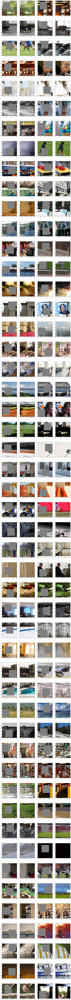

In [106]:
#@title batch_process folder
#@markdown Image areas are marked with green
#%cd /content/co-mod-gan-pytorch
import argparse
import numpy as np
import torch
from co_mod_gan import Generator
from PIL import Image
import glob
import cv2
from tqdm import tqdm
import os
import matplotlib.pyplot as plt

output_path = "datasets/places2sample1k_val/out" #@param
rootdir = "datasets/places2sample1k_val" #@param

MASKS_DIR = "datasets/places2sample1k_val/places2samples1k_256_mask_square128"
IMAGES_DIR = "datasets/places2sample1k_val/places2samples1k_crop256"

files = glob.glob(rootdir + '/**/*.png', recursive=True)

device = "cuda"

net = Generator()
net.load_state_dict(torch.load("checkpoints/co-mod-gan-places2-050000.pth"))
net.eval()
net = net.to(device)

def get_image_pairs(pairs_count=10):
    images = sorted(map(lambda x: f"{IMAGES_DIR}/{x}", os.listdir(IMAGES_DIR)))
    masks = sorted(map(lambda x: f"{MASKS_DIR}/{x}", os.listdir(MASKS_DIR)))
    out = list(zip(images[:pairs_count], masks[:pairs_count]))
    random.shuffle(out)
    return out

def get_image_tensor(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (512,512), cv2.INTER_NEAREST)
    image = (torch.from_numpy(image).unsqueeze(0).permute(0,3,1,2)/255)*2-1
    image = image.to(device)
    return image

def display_tensor(result, ax=None):
    result = result.detach().cpu().numpy()
    result = (result+1)/2
    result = (result[0].transpose((1,2,0)))*255
    if ax:   
        ax.imshow(result.clip(0,255).astype(np.uint8))
        #ax.show()
    else:
        plt.imshow(result.clip(0,255).astype(np.uint8))
        plt.show()
    
def get_mask_tensor(mask_path):
    mask = cv2.imread(mask_path)
    mask = cv2.resize(mask, (512,512), cv2.INTER_NEAREST)
    mask = 1-np.all(mask == [255,255,255], axis=-1).astype(int)
    mask = torch.from_numpy(mask).unsqueeze(0).unsqueeze(0).float()
    mask = mask.to(device)
    return mask

image_count = 100
assert image_count % 2 == 0
fig, axs = plt.subplots(image_count // 2, 4, figsize=(20, image_count * 3))
for i, (image_path, mask_path) in enumerate(get_image_pairs(image_count)):
    latents_in = torch.randn(1, 512)
    latents_in = latents_in.to(device)

    image, mask = get_image_tensor(image_path), get_mask_tensor(mask_path)
    display_tensor(image * mask, ax=axs[i // 2, (i % 2) * 2])
    result = net(image, mask, [latents_in], truncation=None)
    display_tensor(result, ax=axs[i // 2, (i % 2) * 2 + 1])
    # Image.fromarray(result.clip(0,255).astype(np.uint8).clip(0,255).astype(np.uint8)).save(os.path.join(output_path, os.path.basename(f)))

In [67]:
#@title delelete folders and recreate them
%cd /content/
!sudo rm -rf /content/input
!sudo rm -rf /content/output
!mkdir /content/input
!mkdir /content/output

[Errno 2] No such file or directory: '/content/'
/tmp/pycharm_project_722/co-mod-gan-pytorch
[sudo] password for frfoc1: [sudo] password for frfoc1: mkdir: cannot create directory ‘/content/input’: No such file or directory
mkdir: cannot create directory ‘/content/output’: No such file or directory
